In [3]:
print("Beginning script...")
import scanpy as sc
import sys
import seaborn as sns
from matplotlib import pylab as plt
import os
import numpy as np
import pandas as pd
from sklearn import preprocessing
from palettable.colorbrewer.qualitative import Set3_8
from palettable.colorbrewer.qualitative import Set3_9
print("Module loading completed.")


Beginning script...
Module loading completed.


In [28]:
headdir="/oak/stanford/groups/smontgom/amarder/t21-proj"
disease_status="Healthy"
sampletype="Femur"
suffix="" # ".subset"
make_new_3D_UMAP=True

# initialize:
myColors = ['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe',
        '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#ffd8b1', '#000075', '#808080',
        '#307D7E', '#000000', '#DDEFFF', '#000035', '#7B4F4B', '#A1C299', '#300018', '#C2FF99', '#0AA6D8', '#013349',
        '#00846F', '#8CD0FF', '#3B9700', '#04F757', '#C8A1A1', '#1E6E00', '#DFFB71', '#868E7E', '#513A01', '#CCAA35',
        '#800080', '#DAA520', '#1E90FF', '#3CB371', '#9370DB', '#8FBC8F', '#00FF7F', '#0000CD', '#556B2F', '#FF00FF',
        '#CD853F', '#6B8E23', '#008000', '#6495ED', '#00FF00', '#DC143C', '#FFFF00', '#00FFFF', '#FF4500', '#4169E1',
        '#48D1CC', '#191970', '#9ACD32', '#FFA500', '#00FA9A', '#2E8B57', '#40E0D0', '#D2691E', '#66CDAA', '#FFEFD5',
        '#20B2AA', '#FF0000', '#EEE8AA', '#BDB76B', '#E9967A', '#AFEEEE', '#000080', '#FF8C00', '#B22222', '#5F9EA0',
        '#ADFF2F', '#FFE4B5', '#7B68EE', '#7FFFD4', '#0000FF', '#BA55D3', '#90EE90', '#FFDAB9', '#6A5ACD', '#8B0000',
        '#8A2BE2', '#CD5C5C', '#F08080', '#228B22', '#FFD700', '#006400', '#98FB98', '#00CED1', '#00008B', '#9400D3',
        '#9932CC', '#4B0082', '#F0E68C', '#483D8B', '#008B8B', '#8B008B', '#4682B4']

# direc=headdir + "/out/figures/"

suffix="subset"
# for disease_status in ["Healthy"]:
#     for sampletype in ["Liver"]:


suffixDirec=""
if suffix=="subset":
    suffixDirec="subset"
else:
    suffixDirec="full"
os.system("mkdir -p "+headdir + "/out/" + suffixDirec)
print("Done.")

Done.


In [17]:
if suffix=="subset":
    fout="10X_" + disease_status + "_" + sampletype + ".umap.subset.cells_removed.h5ad"
    foutpath=headdir + "/out/data/" + fout
else:
    fout="10X_" + disease_status + "_" + sampletype + ".h5ad"
    foutpath="/oak/stanford/groups/smontgom/amarder/data/t21/ScanpyObjects" + "/" + fout

print("\n * Reading in data..." + foutpath)
adata=sc.read_h5ad(foutpath)

print("Data read completed.")



 * Reading in data.../oak/stanford/groups/smontgom/amarder/t21-proj/out/data/10X_Healthy_Femur.umap.subset.cells_removed.h5ad
Data read completed.


In [18]:
a=[columnName[8:] for columnName in adata.obs.columns if 'leiden_v' in columnName]
colName="leiden_v" + str(max([int(x) for x in a if x.isdigit()]))
print("\n * Cell type column name to use: " + colName)

if disease_status=="Healthy" and sampletype=="Femur":    
    cell_types_to_remove=["0 (to remove)", 
                          "Osteoblasts,4 (to remove)", 
                          "Megakaryocytes,3 (to remove)"]
elif disease_status=="DownSyndrome" and sampletype=="Femur":
    cell_types_to_remove=["Odd PTPRC+ cells (to remove)", 
                          "34,0 (to remove)", 
                          "Odd NK cells (to remove)", 
                          "Pre pro B cells,4 (to remove)"]
elif disease_status=="Healthy" and sampletype=="Liver":
    cell_types_to_remove=["38,0", 
                          "31,0", 
                          "Erythroid cells,2,1", 
                          "34", 
                          "Megakaryocytes,2,0", 
                          "36,1", 
                          "36,0,0", 
                          "36,0,1", 
                          "38,1", 
                          "Megakaryocytes,2,1"]
elif disease_status=="DownSyndrome" and sampletype=="Liver":
    cell_types_to_remove=["do not remove any cells"]
else:
    print("Error!")

print("\n * Indexing the scanpy object...")
adata=adata[~adata.obs[colName].isin(cell_types_to_remove)]

# In[48]:

print("\n * Grouping clusters within broad cell types...")
print("\n * Creating dictionary...")
list_of_cell_types=np.unique(adata.obs[[colName]])
celltypeDict={}
broad_cell_type="Erythroid"; old_cell_types="Erythroid"
celltypeDict[broad_cell_type] = [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="Myeloid"; old_cell_types="Neutrophils"
celltypeDict[broad_cell_type] = [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="Myeloid"; old_cell_types="Macrophages"
celltypeDict[broad_cell_type] += [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="Myeloid"; old_cell_types="pDCs"
celltypeDict[broad_cell_type] += [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="Myeloid"; old_cell_types="cDC2"
celltypeDict[broad_cell_type] += [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="Myeloid"; old_cell_types="Kupffer"
celltypeDict[broad_cell_type] += [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="Myeloid"; old_cell_types="Monocyte"
celltypeDict[broad_cell_type] += [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="Myeloid"; old_cell_types="Osteoclasts"
celltypeDict[broad_cell_type] += [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="HSC/Progenitors"; old_cell_types="HSC"
celltypeDict[broad_cell_type] = [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="HSC/Progenitors"; old_cell_types="MPP"
celltypeDict[broad_cell_type] += [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="HSC/Progenitors"; old_cell_types="MEMP"
celltypeDict[broad_cell_type] += [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="HSC/Progenitors"; old_cell_types="Granulocyte"
celltypeDict[broad_cell_type] += [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="B cells"; old_cell_types="B cells"
celltypeDict[broad_cell_type] = [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="Mast cells"; old_cell_types="Mast cells"
celltypeDict[broad_cell_type] = [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
broad_cell_type="Megakaryocytes"; old_cell_types="Megakaryocytes"
celltypeDict[broad_cell_type] = [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
if disease_status=="DownSyndrome" and sampletype=="Femur":
    broad_cell_type="NK/T cells"; old_cell_types="NK "
    celltypeDict[broad_cell_type] = [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
    broad_cell_type="NK/T cells"; old_cell_types="lymphoid"
    celltypeDict[broad_cell_type] += [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
else:
    broad_cell_type="NK/T cells"; old_cell_types="NK "
    celltypeDict[broad_cell_type] = [s for s in list_of_cell_types if old_cell_types.upper() in s.upper()]
if disease_status=="DownSyndrome" and sampletype=="Femur":
    celltypeDict["Unknown"] = ["Unknown"]
elif disease_status=="DownSyndrome" and sampletype=="Liver":
    celltypeDict["Unknown"] = ["X"]
elif disease_status=="Healthy" and sampletype=="Femur":
    celltypeDict["Unknown"] = ["Unknown 1","Unknown 2"]

list_of_used_cell_types=[]
for sublist in list(celltypeDict.values()):
    for item in sublist:
        list_of_used_cell_types.append(item)

list_of_not_used_cell_types=list(set(list_of_cell_types) - set(list_of_used_cell_types))

celltypeDict["Stroma"] = list_of_not_used_cell_types

print(celltypeDict)

print("\n * Saving new cell type labels to 'cell_type_groups' column in the metadata...")
adata.obs["cell_type_groups"] = np.nan
def create_cell_type_groups(row):
    word=row[colName] 
    topiclist = [topic for topic in celltypeDict if word in celltypeDict[topic]]
    return(topiclist[0])

print("\n * About to run create_cell_type_groups...")
adata.obs["cell_type_groups"] = adata.obs.apply(create_cell_type_groups, axis=1)
print("\n * create_cell_type_groups running complete.")
print("\n * New labels created.")

print("\n * Mapping to numeric labels...")
le = preprocessing.LabelEncoder()
le.fit(adata.obs.loc[:,colName])
adata.obs['numerical_labels'] = le.transform(adata.obs.loc[:,colName]).astype(str)
print("\n * Numeric labels created.")




 * Cell type column name to use: leiden_v9

 * Indexing the scanpy object...


Trying to set attribute `.obs` of view, copying.



 * Grouping clusters within broad cell types...

 * Creating dictionary...
{'Erythroid': ['Early erythroid cells', 'Late erythroid cells'], 'Myeloid': ['Cycling neutrophils', 'Neutrophils', 'Inflammatory macrophages', 'Tolerogenic macrophages', 'pDCs', 'Cycling cDC2', 'cDC2', 'Osteoclasts'], 'HSC/Progenitors': ['HSCs/MPPs', 'HSCs/MPPs', 'MEMPs', 'Granulocyte progenitors'], 'B cells': ['B cells', 'Cycling pro B cells', 'Pre pro B cells', 'Pro B cells'], 'Mast cells': ['Mast cells'], 'Megakaryocytes': ['Megakaryocytes'], 'NK/T cells': ['NK cells'], 'Unknown': ['Unknown 1', 'Unknown 2'], 'Stroma': ['Osteoprogenitors', 'Immature endothelial cells', 'Vascular endothelial cells', 'Osteoblasts', 'LEPR+ CAR cells', 'Sinusoidal endothelial cells', 'Mesenchymal cells 2', 'Pericytes', 'Cycling muscle cells', 'CAR cells', 'Fibroblasts', 'Mesenchymal cells 1', 'Schwann cells', 'Collagen+ myeloid cells', 'Transitioning endothelial cells']}

 * Saving new cell type labels to 'cell_type_groups' colum

In [29]:
print("\n * Re-computing 3D UMAPs...")
if make_new_3D_UMAP:
    adata_3d=sc.tl.umap(adata, random_state=10, n_components=3, init_pos='random',copy=True)
else:
    adata_3d=adata.copy()

print("\n * Re-computing 2D UMAPs...")
sc.tl.umap(adata, random_state=10, n_components=2, init_pos='random')



 * Re-computing 3D UMAPs...

 * Re-computing 2D UMAPs...



 * It is time for... the... U-MAP plots!

 * Plotting & saving UMAP.../oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/umap_group/10X_Healthy_Femur.umap.pdf


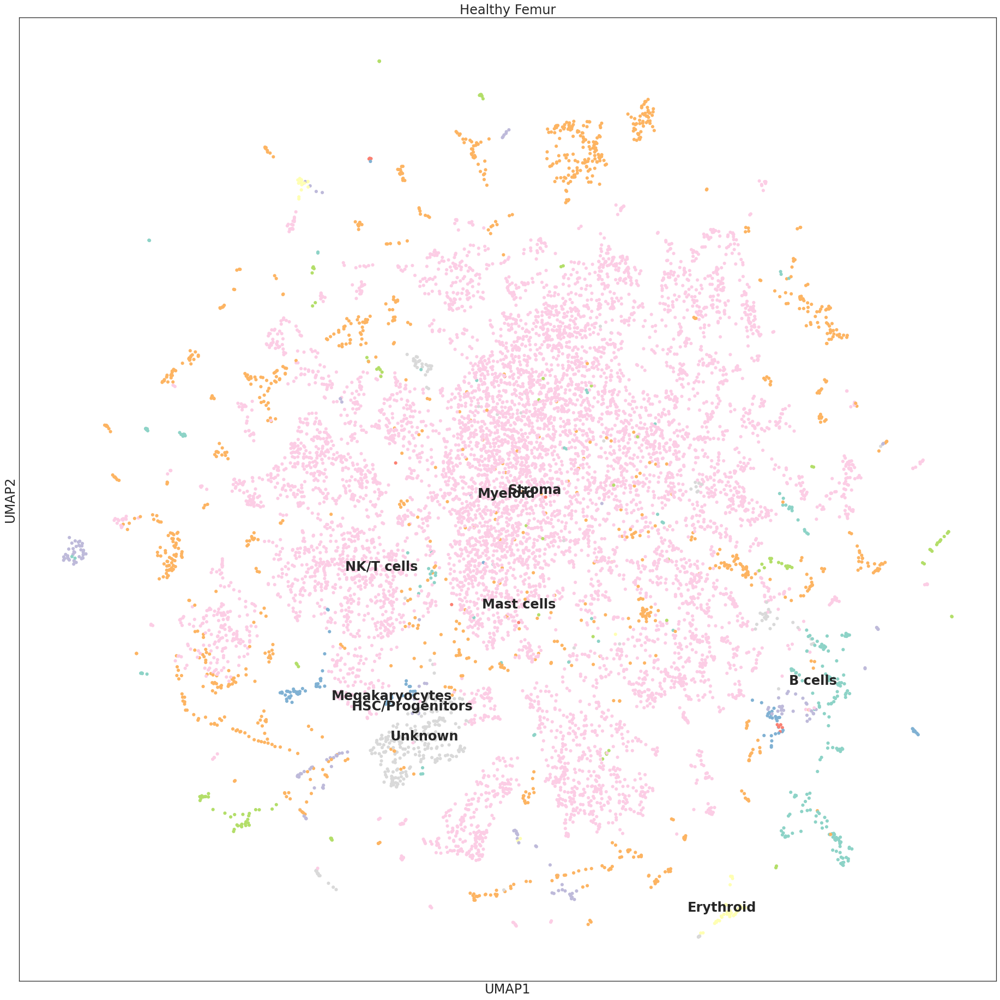


 * Plot saved.

 * Plotting & saving UMAP (no legend).../oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/umap_group/10X_Healthy_Femur.umap.no_legend.pdf


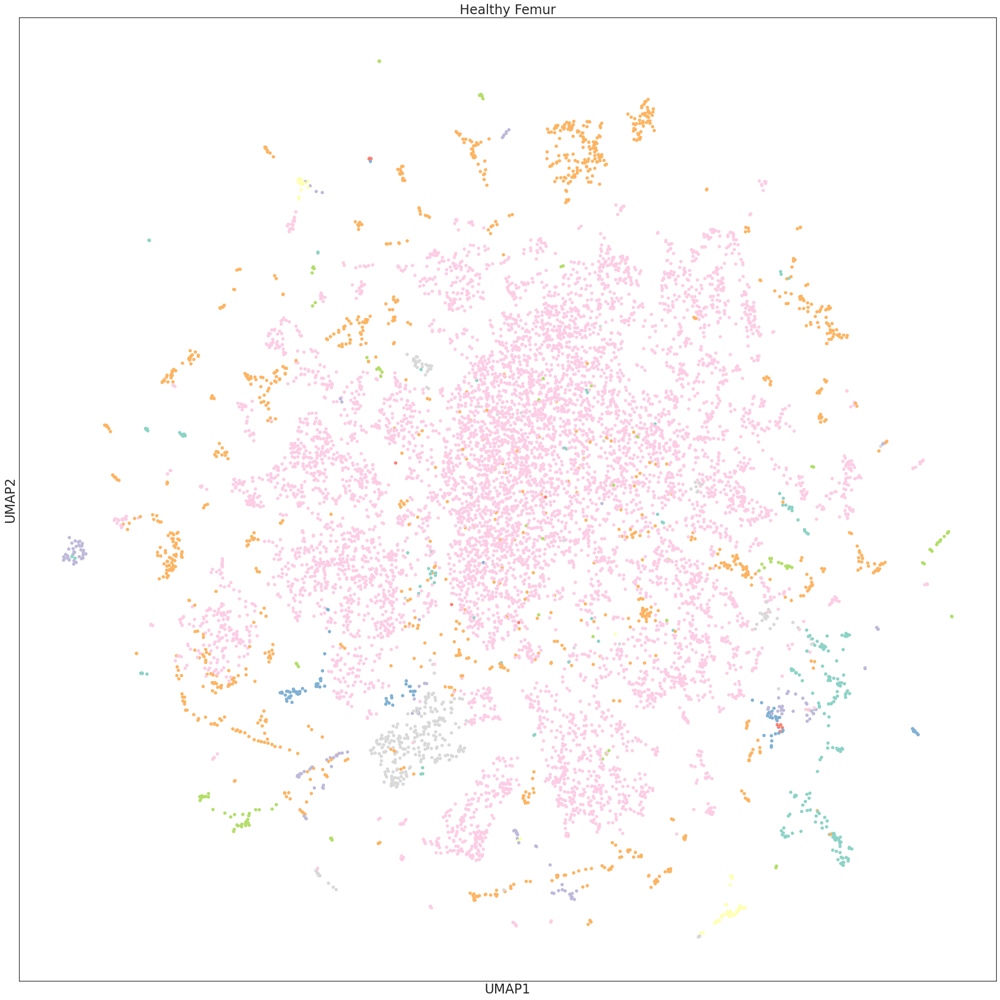


 * Plot saved.

 * Plotting & saving UMAP (numerical labels)... /oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/umap_group/10X_Healthy_Femur.umap.numerical_labels.pdf


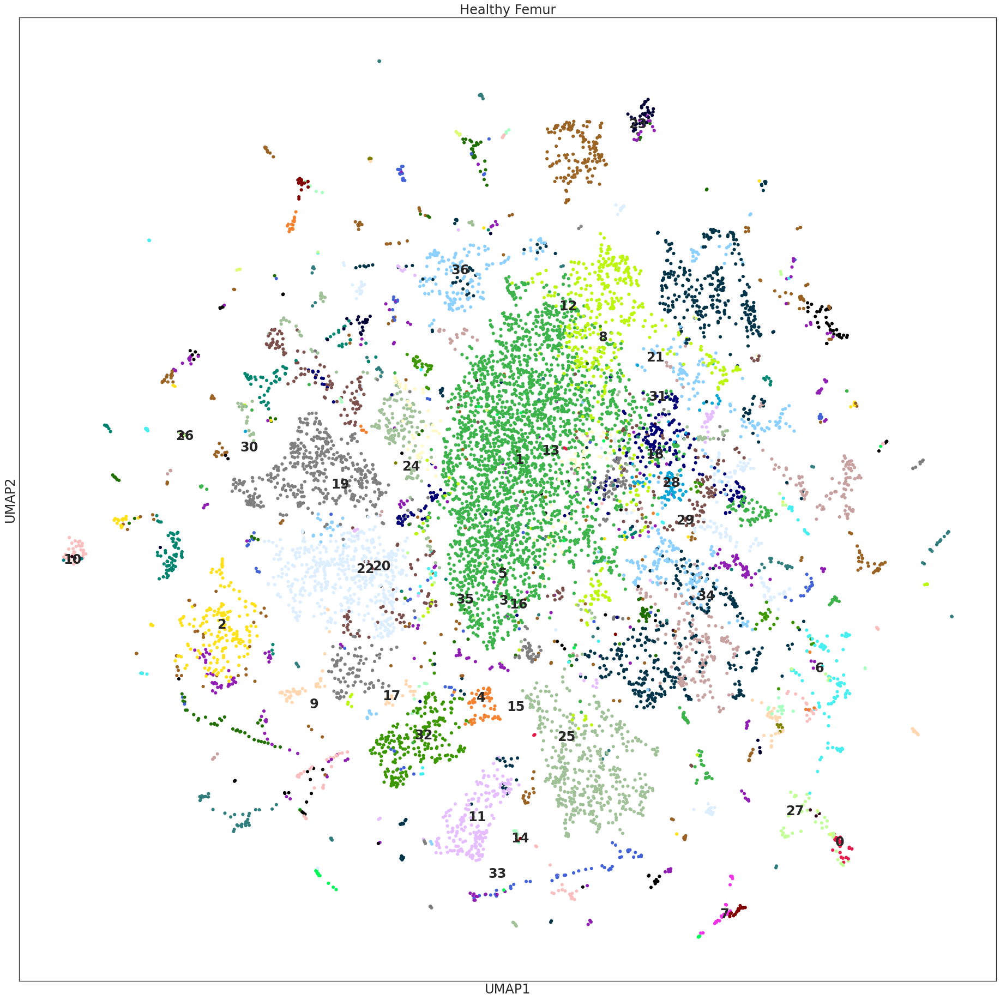


 * Plot saved.

 * Plotting & saving UMAP.../oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/umap_cluster/10X_Healthy_Femur.umap.1.2.pdf


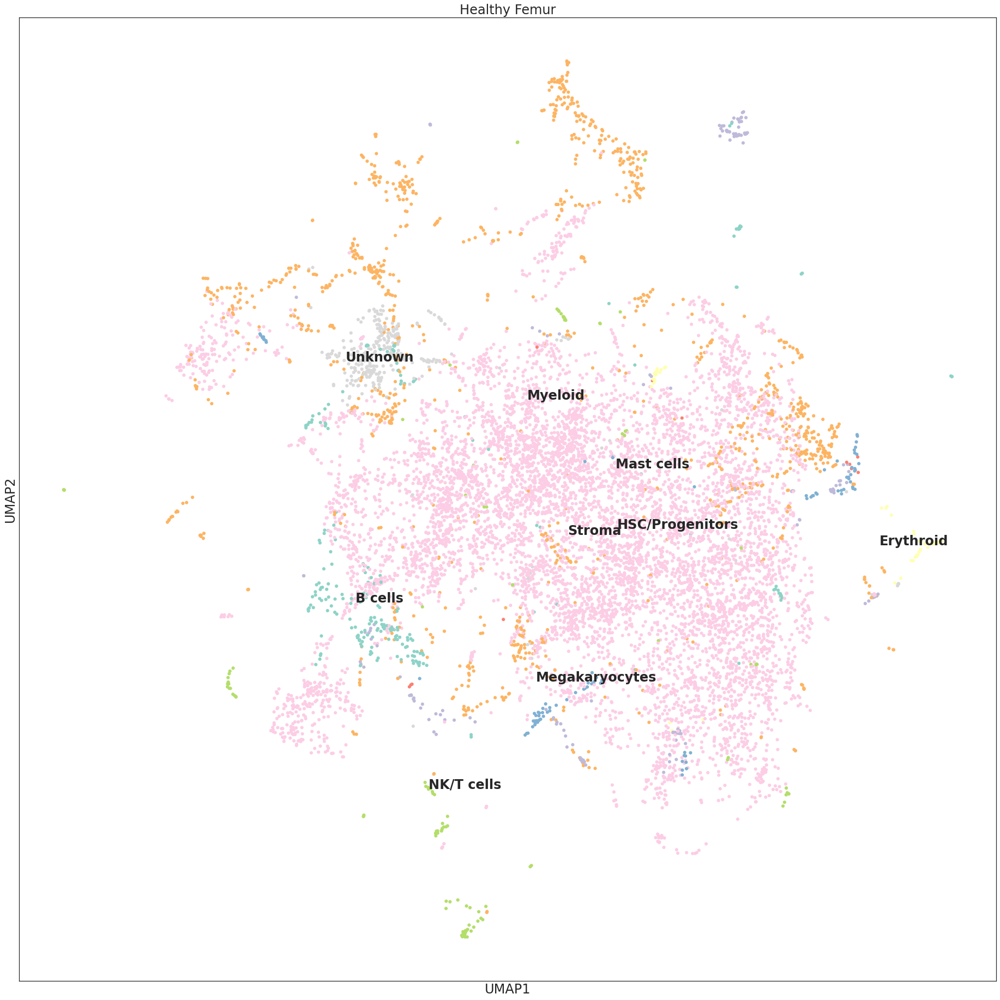


 * Plot saved.

 * Plotting & saving UMAP (no legend).../oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/umap_cluster/10X_Healthy_Femur.umap.1.2.no_legend.pdf


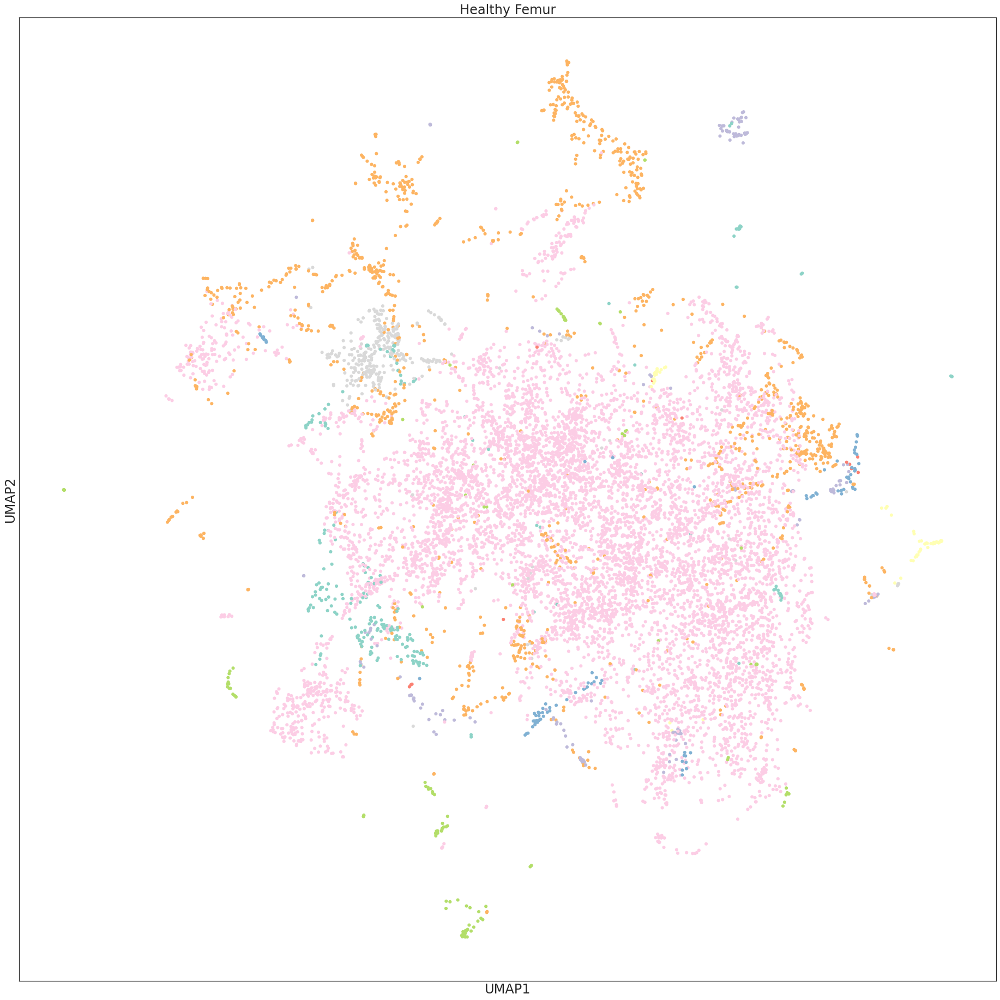


 * Plot saved.

 * Plotting & saving UMAP (numerical labels)... /oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/umap_cluster/10X_Healthy_Femur.umap.1.2.numerical_labels.pdf


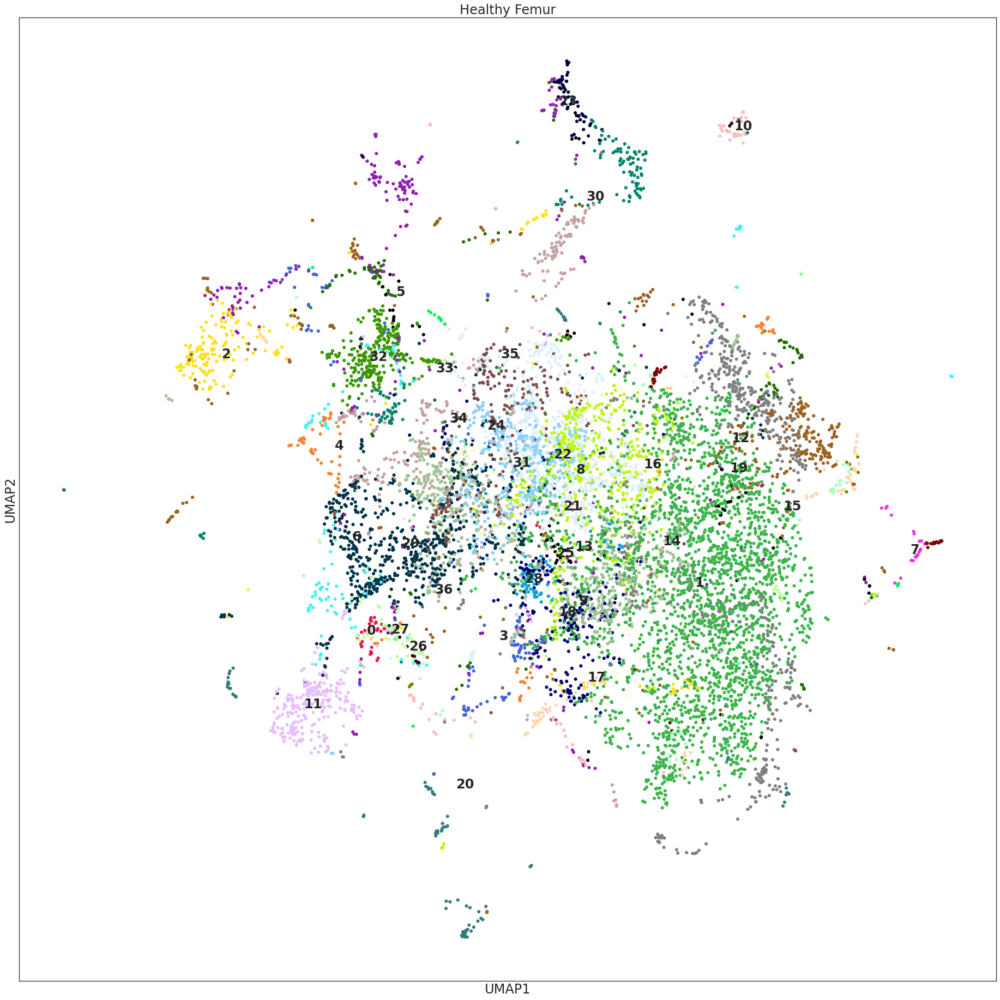


 * Plot saved.

 * Plotting & saving UMAP.../oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/umap_cluster/10X_Healthy_Femur.umap.1.3.pdf


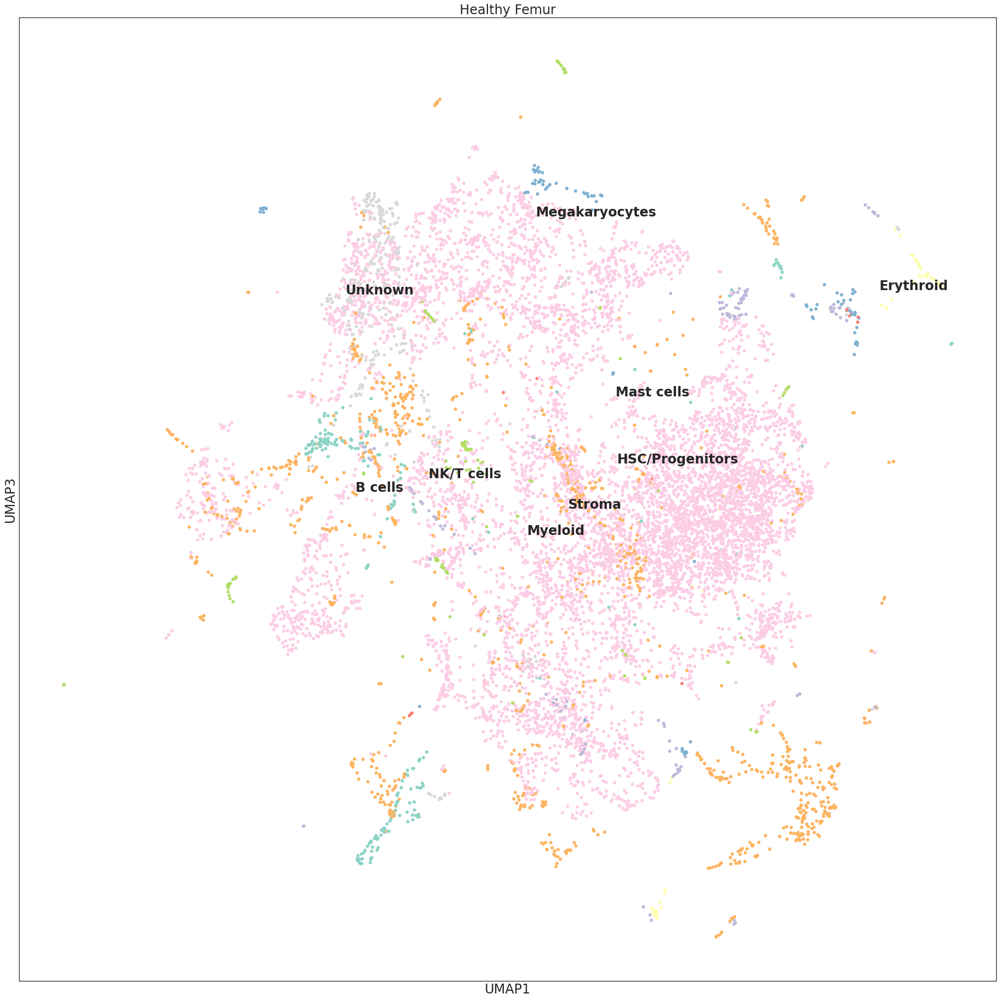


 * Plot saved.

 * Plotting & saving UMAP (no legend).../oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/umap_cluster/10X_Healthy_Femur.umap.1.3.no_legend.pdf


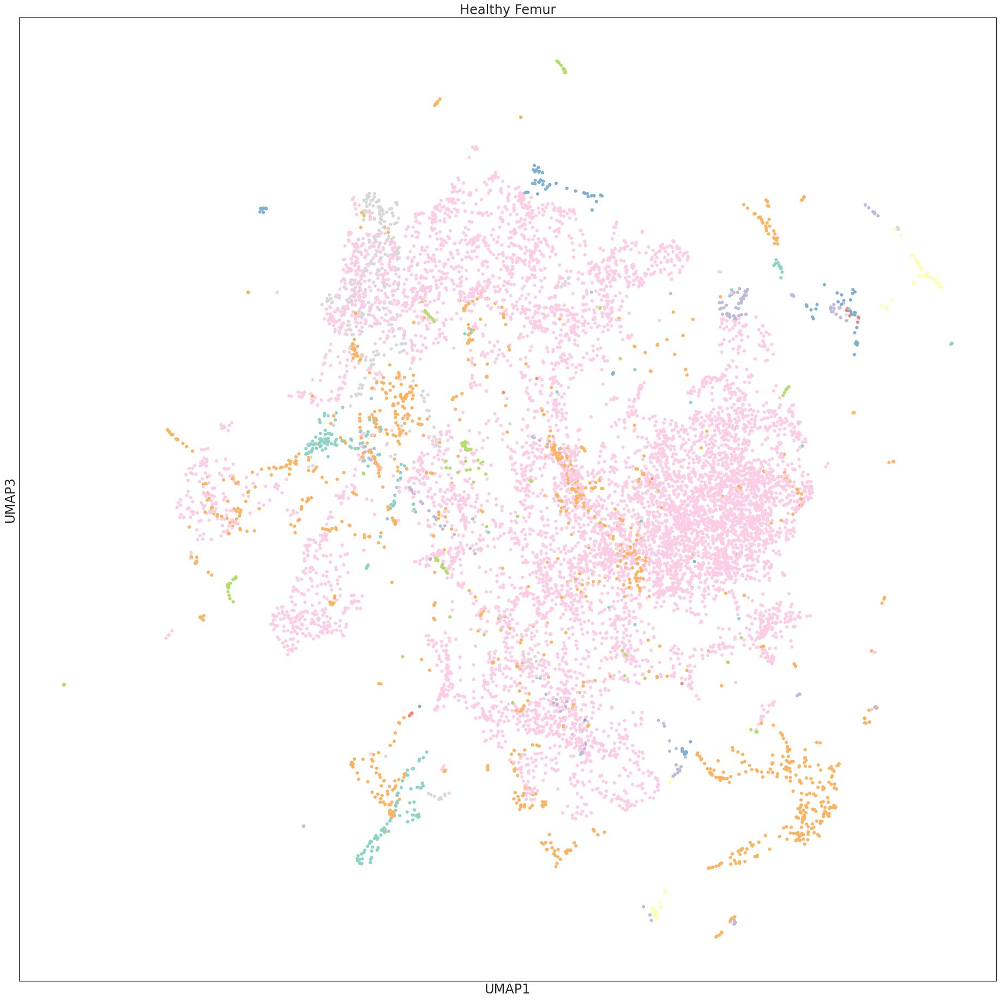


 * Plot saved.

 * Plotting & saving UMAP (numerical labels)... /oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/umap_cluster/10X_Healthy_Femur.umap.1.3.numerical_labels.pdf


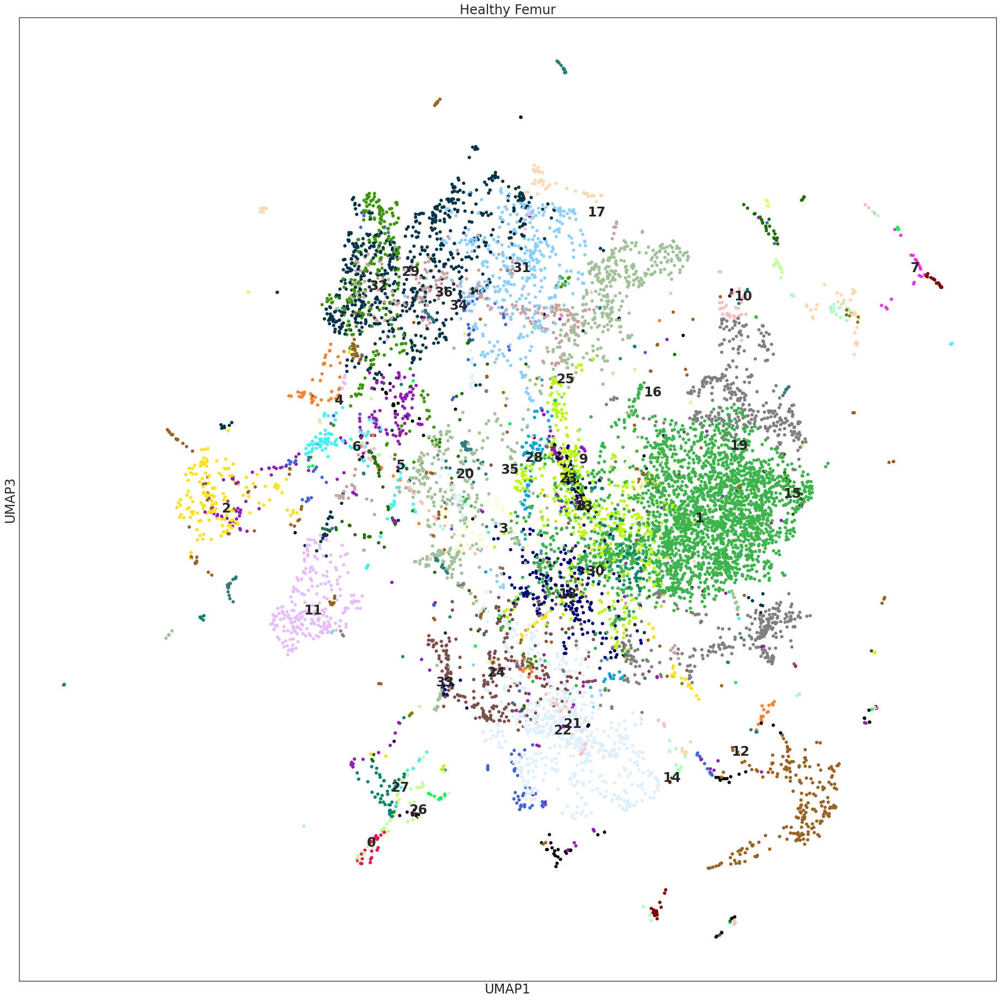


 * Plot saved.

 * Plotting & saving UMAP.../oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/umap_cluster/10X_Healthy_Femur.umap.2.3.pdf


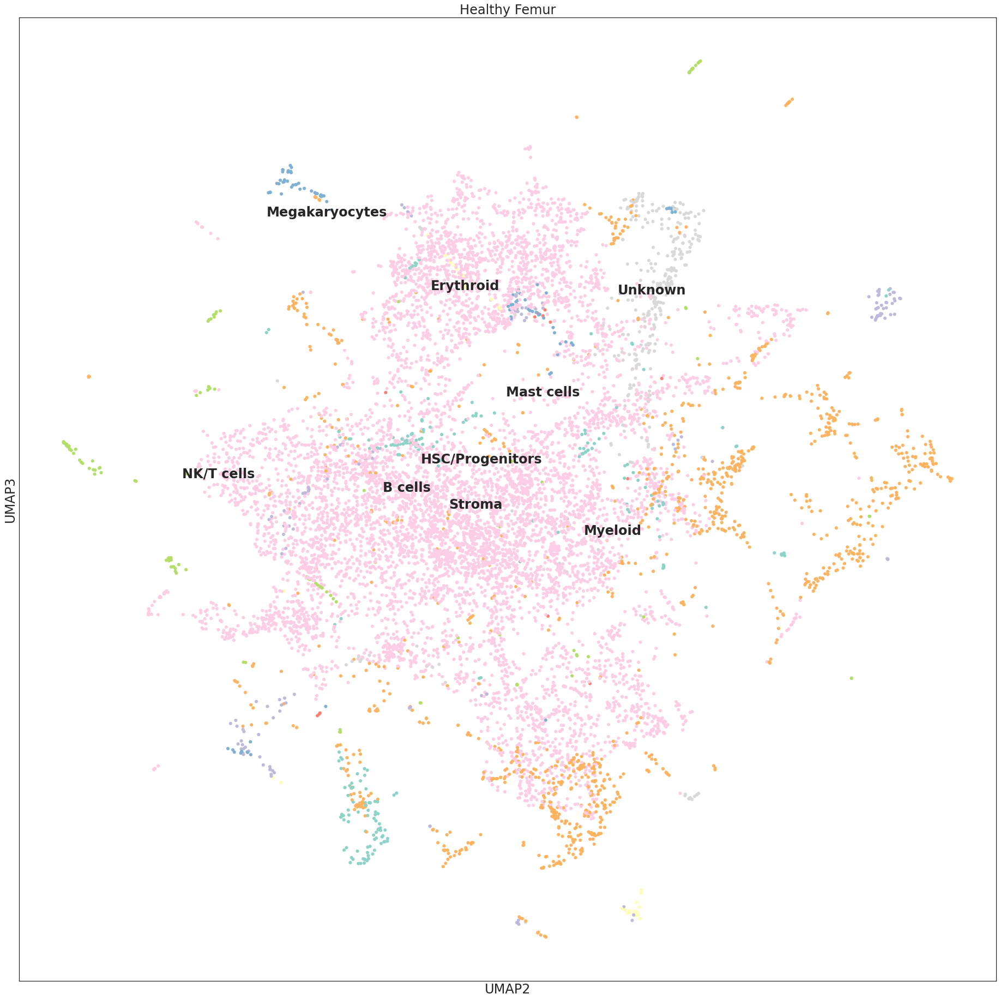


 * Plot saved.

 * Plotting & saving UMAP (no legend).../oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/umap_cluster/10X_Healthy_Femur.umap.2.3.no_legend.pdf


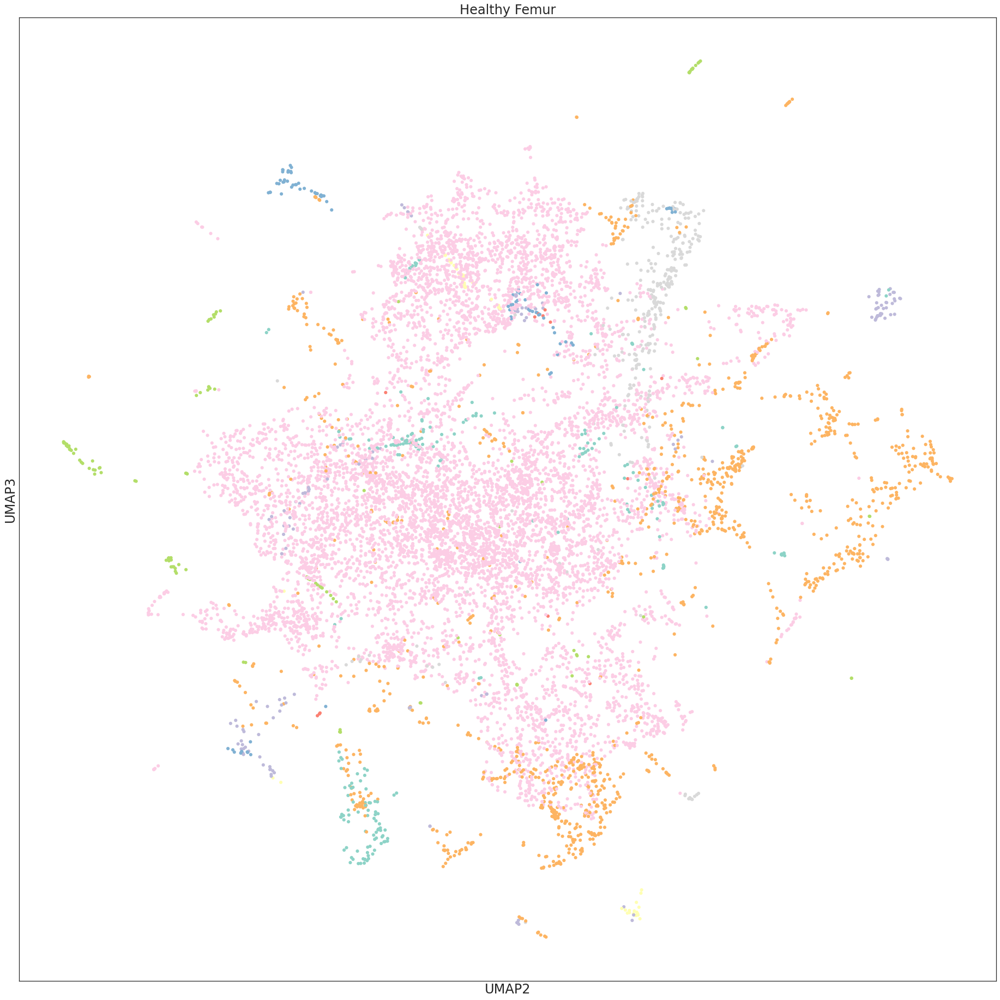


 * Plot saved.

 * Plotting & saving UMAP (numerical labels)... /oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/umap_cluster/10X_Healthy_Femur.umap.2.3.numerical_labels.pdf


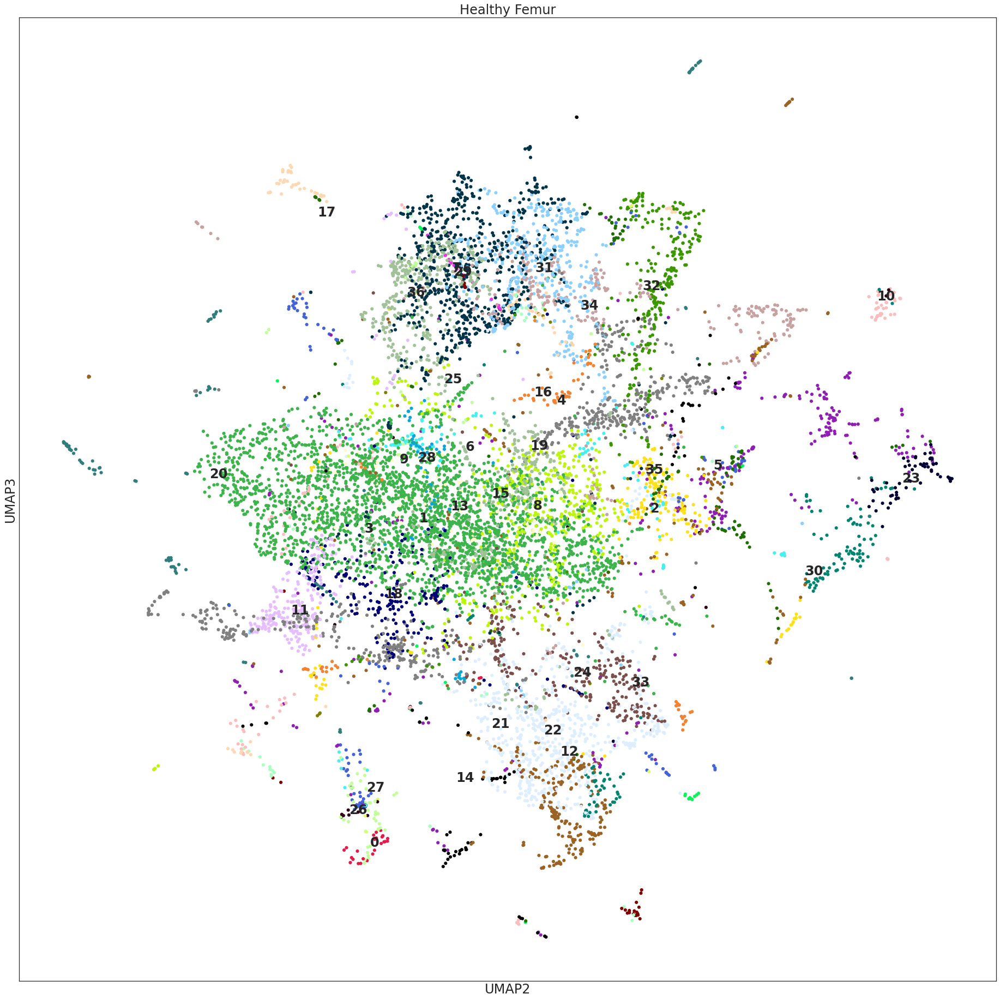


 * Plot saved.


In [40]:
##############################

print("\n * It is time for... the... U-MAP plots!")

if disease_status=="Healthy" and sampletype=="Liver":
    colors_to_use = Set3_8.mpl_colors
else:
    colors_to_use = Set3_9.mpl_colors

subDirec="umap_group"
os.system("mkdir -p "+headdir + "/out/" + suffixDirec +"/" + subDirec)
fplotout=headdir + "/out/" + suffixDirec + "/" + subDirec + "/" + "10X_"+disease_status+"_"+sampletype+".umap.pdf"
print("\n * Plotting & saving UMAP..." + fplotout)
f, axs = plt.subplots(1,1,figsize=(26,26))
sns.set(font_scale=2)
sns.set_style("white")
sc.pl.umap(adata, color="cell_type_groups", size=150, palette=colors_to_use, components='1,2', ax=axs, show=False, use_raw=False, title=disease_status + ' ' + sampletype,legend_loc="on data")
plt.tight_layout()
plt.savefig(fplotout)
plt.show()
plt.close()
print("\n * Plot saved.")

fplotout=headdir + "/out/" + suffixDirec + "/" + subDirec + "/" + "10X_"+disease_status+"_"+sampletype+".umap.no_legend.pdf"
print("\n * Plotting & saving UMAP (no legend)..." + fplotout)
f, axs = plt.subplots(1,1,figsize=(26,26))
sns.set(font_scale=2)
sns.set_style("white")
new_plot=sc.pl.umap(adata, color="cell_type_groups", size=150, palette=colors_to_use, components='1,2', ax=axs, show=False, use_raw=False, title=disease_status + ' ' + sampletype,legend_loc="None")
plt.tight_layout()
plt.savefig(fplotout)
plt.show()
plt.close()
print("\n * Plot saved.")

fplotout=headdir + "/out/" + suffixDirec + "/" + subDirec + "/" + "10X_"+disease_status+"_"+sampletype+".umap"+".numerical_labels.pdf"
# os.remove(fplotout)
print("\n * Plotting & saving UMAP (numerical labels)... " + fplotout)
f, axs = plt.subplots(1,1,figsize=(26,26))
sns.set(font_scale=2)
sns.set_style("white")
new_plot=sc.pl.umap(adata, color="numerical_labels", size=150, palette=myColors, components='1,2', ax=axs, show=False, use_raw=False, title=disease_status + ' ' + sampletype,legend_loc="on data")
plt.tight_layout()
plt.savefig(fplotout)
plt.show()
plt.close()
print("\n * Plot saved.")

##############################

subDirec="umap_cluster"
os.system("mkdir -p "+headdir + "/out/" + suffixDirec +"/" + subDirec)
for components_to_use in ["1,2","1,3","2,3"]:

    Name_components_to_use = components_to_use.replace(",",".")
    fplotout=headdir + "/out/" + suffixDirec + "/" + subDirec + "/" + "10X_"+disease_status+"_"+sampletype+".umap."+Name_components_to_use+".pdf"
    print("\n * Plotting & saving UMAP..." + fplotout)
    f, axs = plt.subplots(1,1,figsize=(26,26))
    sns.set(font_scale=2)
    sns.set_style("white")
    sc.pl.umap(adata_3d, color="cell_type_groups", size=150, palette=colors_to_use, components=[components_to_use], ax=axs, show=False, use_raw=False, title=disease_status + ' ' + sampletype,legend_loc="on data")
    plt.tight_layout()
    plt.savefig(fplotout)
    plt.show()
    plt.close()
    print("\n * Plot saved.")

    fplotout=headdir + "/out/" + suffixDirec + "/" + subDirec + "/" + "10X_"+disease_status+"_"+sampletype+".umap."+Name_components_to_use+".no_legend.pdf"
    print("\n * Plotting & saving UMAP (no legend)..." + fplotout)
    f, axs = plt.subplots(1,1,figsize=(26,26))
    sns.set(font_scale=2)
    sns.set_style("white")
    new_plot=sc.pl.umap(adata_3d, color="cell_type_groups", size=150, palette=colors_to_use, components=[components_to_use], ax=axs, show=False, use_raw=False, title=disease_status + ' ' + sampletype,legend_loc="None")
    plt.tight_layout()
    plt.savefig(fplotout)
    plt.show()
    plt.close()
    print("\n * Plot saved.")

    fplotout=headdir + "/out/" + suffixDirec + "/" + subDirec + "/" + "10X_"+disease_status+"_"+sampletype+".umap."+Name_components_to_use+".numerical_labels.pdf"
    # os.remove(fplotout)
    print("\n * Plotting & saving UMAP (numerical labels)... " + fplotout)
    f, axs = plt.subplots(1,1,figsize=(26,26))
    sns.set(font_scale=2)
    sns.set_style("white")
    new_plot=sc.pl.umap(adata_3d, color="numerical_labels", size=150, palette=myColors, components=[components_to_use], ax=axs, show=False, use_raw=False, title=disease_status + ' ' + sampletype,legend_loc="on data")
    plt.tight_layout()
    plt.savefig(fplotout)
    plt.show()
    plt.close()
    print("\n * Plot saved.")





 * Plotting & saving dotplot.../oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/dotplots/10X_Healthy_Femur.dotplot.pdf


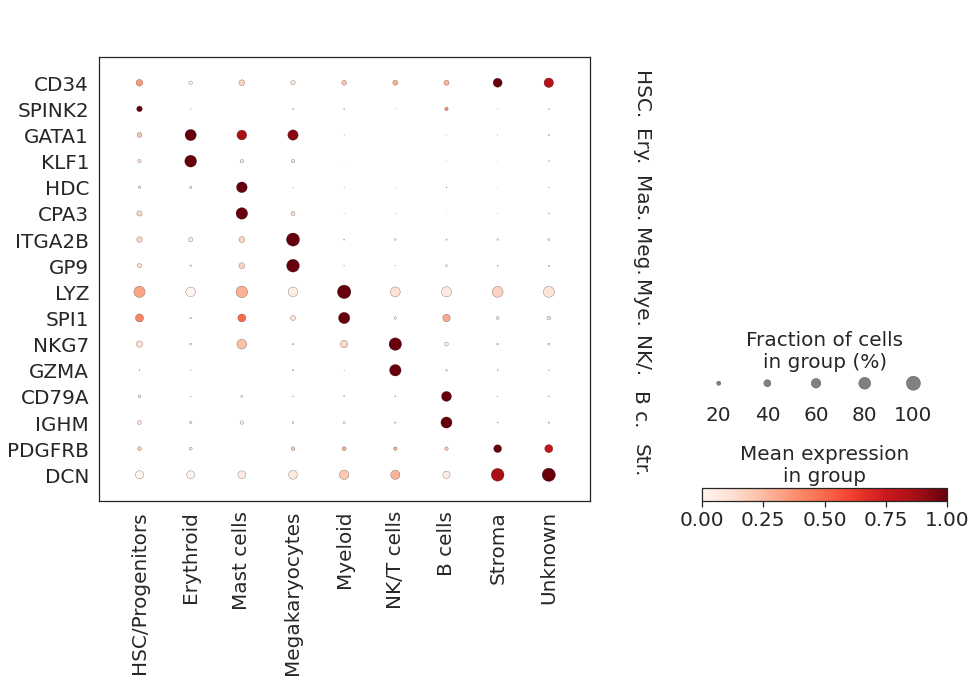

categories: 0, 1, 2, etc.
var_group_labels: HSC/Progenitors, Erythroid, Mast cells, etc.



 * Plot saved.

 * Plotting & saving dotplot.../oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/dotplots/10X_Healthy_Femur.dotplot.clusters.pdf


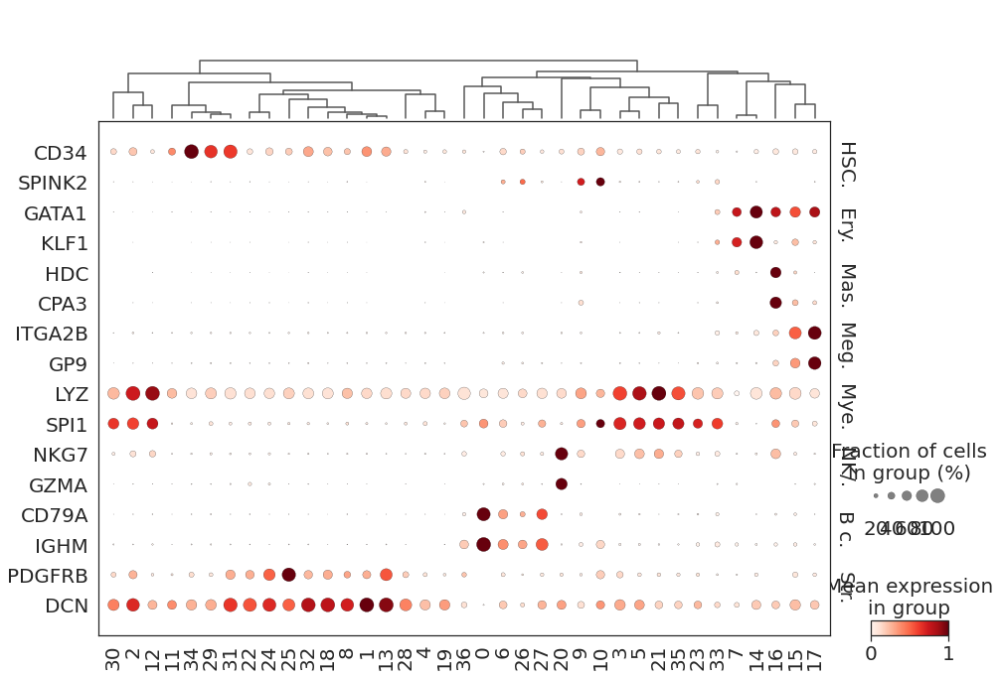


 * Plot saved.


In [34]:
subDirec="dotplots"
os.system("mkdir -p "+headdir + "/out/" + suffixDirec +"/" + subDirec)

if disease_status=="Healthy" and sampletype=="Liver":
    categories_order_to_use = ['HSC/Progenitors','Erythroid','Mast cells','Megakaryocytes','Myeloid','NK/T cells','B cells','Stroma']
else:
    categories_order_to_use = ['HSC/Progenitors','Erythroid','Mast cells','Megakaryocytes','Myeloid','NK/T cells','B cells','Stroma','Unknown']

markerDict= {'HSC/Progenitors' : ['CD34', 'SPINK2'],
              'Erythroid' : ['GATA1', 'KLF1'],
              'Mast cells' : ['HDC', 'CPA3'],
              'Megakaryocytes' : ['ITGA2B', 'GP9'],
              'Myeloid' :[ 'LYZ', 'SPI1'],
              'NK/T cells' : ['NKG7', 'GZMA'],
              'B cells' : ['CD79A', 'IGHM'],
              'Stroma' : ['ALB', 'AFP']}

if sampletype=="Femur":
    markerDict['Stroma'] = ['PDGFRB','DCN']

fplotout=headdir + "/out/" + suffixDirec + "/" + subDirec + "/" + "10X_"+disease_status+"_"+sampletype+".dotplot.pdf"
print("\n * Plotting & saving dotplot..." + fplotout)
f, axs = plt.subplots(1,1,figsize=(14,10))
sc.pl.dotplot(adata,
               markerDict,
               groupby="cell_type_groups",
               standard_scale='var',
               smallest_dot=0.0,
               dot_min=None,
               dot_max=None,
               color_map='Reds',
               dendrogram=False,
               categories_order=categories_order_to_use,
               show=False,
               ax=axs,
               linewidths=2,swap_axes=True)
plt.tight_layout()
plt.show()
plt.savefig(fplotout)
# plt.show()
plt.close()
print("\n * Plot saved.")

fplotout=headdir + "/out/" + suffixDirec + "/" + subDirec + "/"  + "10X_"+disease_status+"_"+sampletype+".dotplot.clusters.pdf"
print("\n * Plotting & saving dotplot..." + fplotout)
f, axs = plt.subplots(1,1,figsize=(14,10))
sc.pl.dotplot(adata,
               markerDict,
               # groupby=colName,
               groupby="numerical_labels",
               standard_scale='var',
               smallest_dot=0.0,
               dot_min=None,
               dot_max=None,
               color_map='Reds',
               dendrogram=True,
               show=False,
               ax=axs,
               linewidths=2,swap_axes=True)
plt.tight_layout()
plt.savefig(fplotout)
plt.show()
plt.close()
print("\n * Plot saved.")



In [36]:
subDirec="cluster_to_label_mapping"
os.system("mkdir -p "+headdir + "/out/" + suffixDirec +"/" + subDirec)
pd.set_option('display.max_rows', None)
cluster_to_label_mapping=adata.obs[["numerical_labels",colName,"cell_type_groups"]].drop_duplicates().sort_values("numerical_labels")
fout="10X_" + disease_status + "_" + sampletype + ".cluster_to_label_mapping.csv"
foutpath=headdir + "/out/" + suffixDirec + "/" + subDirec + "/" + fout
print("\n * Saving cluster_to_label_mapping: " + foutpath)
cluster_to_label_mapping.to_csv(foutpath)
# print(cluster_to_label_mapping.to_string(index=False))
pd.set_option('display.max_rows', 10)
print("Done.")

subDirec="cellComp"
os.system("mkdir -p "+headdir + "/out/" + suffixDirec +"/" + subDirec)
fout="10X_" + disease_status + "_" + sampletype + ".cellComp.csv"
foutpath=headdir + "/out/" + suffixDirec + "/" + subDirec + "/" + fout
print("\n * Saving celltypeComp: " + foutpath)
adata.obs.loc[:,["patient","sample","sorting","numerical_labels",colName,"cell_type_groups"]].to_csv(foutpath)
print("Done.")

subDirec="data"
os.system("mkdir -p "+headdir + "/out/" + suffixDirec +"/" + subDirec)
fout="10X_" + disease_status + "_" + sampletype + ".umap3d.cells_removed.h5ad"
foutpath=headdir + "/out/" + suffixDirec + "/" + subDirec + "/" + fout
print("\n * Saving 3d data to file..." + foutpath)
adata_3d.write(foutpath)
print("Done.")
fout="10X_" + disease_status + "_" + sampletype + ".umap2d.cells_removed.h5ad"
foutpath=headdir + "/out/" + suffixDirec + "/" + subDirec + "/" + fout
print("\n * Saving 2d data to file..." + foutpath)
adata.write(foutpath)
print("Done.")
print("\n * Script completed.")



 * Saving cluster_to_label_mapping: /oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/cluster_to_label_mapping/10X_Healthy_Femur.cluster_to_label_mapping.csv
Done.

 * Saving celltypeComp: /oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/cellComp/10X_Healthy_Femur.cellComp.csv
Done.

 * Saving 3d data to file.../oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/data/10X_Healthy_Femur.umap3d.cells_removed.h5ad
Done.

 * Saving 2d data to file.../oak/stanford/groups/smontgom/amarder/t21-proj/out/subset/data/10X_Healthy_Femur.umap2d.cells_removed.h5ad
Done.

 * Script completed.


In [45]:
from palettable.colorbrewer.qualitative import Set3_6,Set3_7
Set3_6
#Set3_7